In [1]:
import matplotlib.pylab as plt
from builderfuncs import restore_model
import numpy as np
from typing import Tuple, Dict
np.set_printoptions(edgeitems=30, linewidth=100000, 
    formatter=dict(float=lambda x: "%.3g" % x))
import matplotlib.pyplot as plt
import pandas as pd
from einops import rearrange, repeat
import tensorflow as tf
from tensorflow.math import logical_not


pd.set_option('display.max_columns', None)
df = pd.read_csv('data/scaled_U2_data.csv', index_col=0)
df.drop("UNNAMED: 0", axis=1, inplace=True)

devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(devices[0], True)

print("Num GPUs Available: ", len(devices))

Num GPUs Available:  1


In [2]:
def mask_window(features: Tuple[Dict[tf.Tensor, tf.Tensor], tf.Tensor], 
                mask: tf.Tensor) -> Tuple[Dict[tf.Tensor, tf.Tensor], 
                                          tf.Tensor]:
    inputs = features[0]
    labels = features[1]
    decoder_labels = tf.einsum('tf,t->tf', labels, mask)
    mask = repeat(mask, 'i -> 1 i j', j=labels.shape[-2])
    mask = tf.math.minimum(mask, rearrange(mask, '1 i j -> 1 j i'))
    decoder_labels.set_shape([12, None])
    mask.set_shape([None, 12, 12])
    inputs.update({'decoder_labels':decoder_labels,
                   'attention_mask':mask})
    return inputs, labels


def tf_split_window(features: tf.Tensor) -> Tuple[Dict[tf.Tensor, tf.Tensor],
                                               tf.Tensor]:
    encoder_input = features[:12, 1:]
    decoder_input = features[11:, 1:75]
    labels = rearrange(features[11:, 0], 'a -> a 1')
    encoder_input.set_shape([12, 247])
    decoder_input.set_shape([12, 74])
    labels.set_shape([12, None])
    

    return {'encoder_inputs':encoder_input, 'decoder_inputs':decoder_input}, labels

def jp_split_window(features: tf.Tensor) -> Tuple[Dict[tf.Tensor, tf.Tensor],
                                               tf.Tensor]:
    encoder_input = features[:12, 1:]
    decoder_input = features[12:, 1:75]
    paddings = tf.constant([[0, 0,], [0, 173]])
    encoder_input = tf.concat([encoder_input, tf.pad(decoder_input, paddings, "CONSTANT")], axis=0)
    labels = rearrange(features[11:, 0], 'a -> a 1')
    decoder_input = features[11:, 1:75]
    encoder_input.set_shape([23, 247])
    decoder_input.set_shape([12, 74])
    labels.set_shape([12, None])
    

    return {'encoder_inputs':encoder_input, 'decoder_inputs':decoder_input}, labels

def gru_split_window(features: tf.Tensor) -> Tuple[Dict[tf.Tensor, tf.Tensor],
                                               tf.Tensor]:
    inputs = features[:12, 1:]
    state_labels = features[12, 75:]
    targ_labels = tf.expand_dims(features[11, 0], axis=0)
    labels = tf.concat([targ_labels, state_labels], axis=0)
    inputs.set_shape([12, 247])
    labels.set_shape([174])
    

    return inputs, labels, features

                        
def make_dataset(data: pd.DataFrame, length: int, 
                 batch_size: int = 64, multistep: bool = True) -> Tuple[tf.data.Dataset, 
                                                                        tf.data.Dataset, 
                                                                        tf.data.Dataset]:
    data = np.array(data.iloc[:, :], dtype=np.float32)
    ds = tf.keras.utils.timeseries_dataset_from_array(data=data,
                                                        targets=None,
                                                        sequence_length=length,
                                                        sequence_stride=1,
                                                        shuffle=False,
                                                        batch_size=None)

    ds = ds.filter(lambda x: tf.reduce_all(logical_not(tf.math.is_nan(x))))
    nums = np.zeros(170680)
    mask = tf.sequence_mask(nums, length/2, dtype=tf.float32)
    maskds = tf.data.Dataset.from_tensor_slices(mask)
    tds = ds.map(tf_split_window)
    tds = tf.data.Dataset.zip((tds, maskds))
    tds = tds.map(mask_window).batch(batch_size)
    pds = ds.map(jp_split_window)
    pds = tf.data.Dataset.zip((pds, maskds))
    pds = pds.map(mask_window).batch(batch_size)
    gruds = ds.map(gru_split_window).batch(batch_size)

    return tds, pds, gruds

In [3]:
def gradient_importance(seq, model):    
    # seq['encoder_inputs'] = tf.Variable(seq['encoder_inputs'], dtype=tf.float32)
    # seq['decoder_inputs'] = tf.Variable(seq['decoder_inputs'], dtype=tf.float32) 
    # seq['decoder_labels'] = tf.Variable(seq['decoder_labels'], dtype=tf.float32) 
    # seq['attention_mask'] = tf.Variable(seq['attention_mask'], dtype=tf.float32) 
    with tf.GradientTape() as tape:
        if type(seq) == dict:
            for key in list(seq.keys()):
                tape.watch(seq[key])
        else:
            tape.watch(seq)
        predictions = model(seq)    
    grads = tape.gradient(predictions, seq)
    
    return grads, predictions

In [4]:
t_data, p_data, gru_data = make_dataset(df, 23, batch_size=1048)


In [5]:
t = next(iter(t_data))
p = next(iter(p_data))
g = next(iter(gru_data))
t_inputs = t[0]
p_inputs = p[0]
g_inputs = g[0]
t_labels = t[1]
p_labels = p[1]
g_labels = g[1]
g_features = g[2]

In [6]:
print(np.sqrt(np.var(g_inputs[0, :, 74])))

1.4901161e-08


In [7]:
transformer = restore_model("model_folder/transformer_folder", modeltype="transformer")
park = restore_model("parkdir/trial_052", modeltype="transformer")
gru = restore_model("model_folder/gru_folder", modeltype="gru")
bigru = restore_model("model_folder/bigru_folder", modeltype="bigru")
lstm = restore_model("model_folder/lstm_folder", modeltype="lstm")
bilstm = restore_model("model_folder/bilstm_folder", modeltype="bilstm")

c:\Users\Owner\code\Work\TSCompare\builderfuncs.py:439: UserWarning: Model weights could not be loaded properly with positional embeddings. Loading without embeddings.
  warnings.warn("Model weights could not be loaded properly with positional embeddings. Loading without embeddings.")


In [8]:
t_grads = gradient_importance(t_inputs, transformer)
p_grads = gradient_importance(p_inputs, park)
gru_grads = gradient_importance(g_inputs, gru)
bigru_grads = gradient_importance(g_inputs, bigru)
lstm_grads = gradient_importance(g_inputs, lstm)
bilstm_grads = gradient_importance(g_inputs, bilstm)

In [9]:
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
from matplotlib.lines import Line2D

def label_encoder(length):
    plt.plot([0.1, 71.9], [length+3, length+3], clip_on=False, color='k')
    plt.plot([0.1, 0.1], [length+3, length], clip_on=False, color='k')
    plt.plot([71.9, 71.9], [length+3, length], clip_on=False, color='k')
    plt.text(32, length+4, "Control Decisions")

    plt.plot([72.1, 73.9], [length+3, length+3], clip_on=False, color='k')
    plt.plot([72.1, 72.1], [length+3, length], clip_on=False, color='k')
    plt.plot([73.9, 73.9], [length+3, length], clip_on=False, color='k')
    plt.text(68, length+5.3, "MW_END_REMOTE\nMW_NET_GROSS")

    plt.plot([89.1, 94.9], [length+3, length+3], clip_on=False, color='k')
    plt.plot([89.1, 89.1], [length+3, length], clip_on=False, color='k')
    plt.plot([94.9, 94.9], [length+3, length], clip_on=False, color='k')
    plt.text(91, length+4, "O\u2082")

    plt.plot([95.1, 105.9], [length+3, length+3], clip_on=False, color='k')
    plt.plot([95.1, 95.1], [length+3, length], clip_on=False, color='k')
    plt.plot([105.9, 105.9], [length+3, length], clip_on=False, color='k')
    plt.text(98, length+4, "Mills")


def label_decoder(length):
    plt.plot([0.1, 71.9], [length+2, length+2], clip_on=False, color='k')
    plt.plot([0.1, 0.1], [length+2, length], clip_on=False, color='k')
    plt.plot([71.9, 71.9], [length+2, length], clip_on=False, color='k')
    plt.text(32, length+3.1, "Control Decisions")

    plt.plot([72.1, 73.9], [length+2, length+2], clip_on=False, color='k')
    plt.plot([72.1, 72.1], [length+2, length], clip_on=False, color='k')
    plt.plot([73.9, 73.9], [length+2, length], clip_on=False, color='k')
    plt.text(68, length+4, "MW_END_REMOTE\nMW_NET_GROSS")


def plotmap(data, maptype, title, func, length):
    
    if maptype == 'encoder':
        fig, ax = plt.subplots(figsize=(40, 40), facecolor=(1,1,1,0)) 
        sns.heatmap(func(data, axis=0), cmap="bwr", center=0, square=True, cbar=False, vmin=-1.0, vmax=1.0, ax=ax)
        label_encoder(length)
    else:
        fig, ax = plt.subplots(figsize=(15, 15), facecolor=(1,1,1,0)) 
        sns.heatmap(func(data, axis=0), cmap="bwr", center=0, square=True, cbar=False, vmin=-1.0, vmax=1.0, ax=ax)
        label_decoder(length)
    plt.title(title)
    
    plt.savefig(f'figures/{title}.svg', bbox_inches='tight')
    plt.show()

def farfrom0(arr, axis):
    return np.max(np.abs(arr), axis=axis)


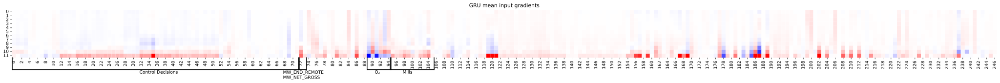

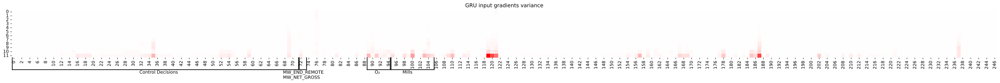

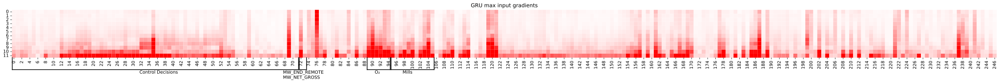

In [10]:
plotmap(gru_grads[0], 'encoder', 'GRU mean input gradients', np.mean, 12)
plotmap(gru_grads[0], 'encoder', 'GRU input gradients variance', np.var, 12)
plotmap(gru_grads[0], 'encoder', 'GRU max input gradients', farfrom0, 12)

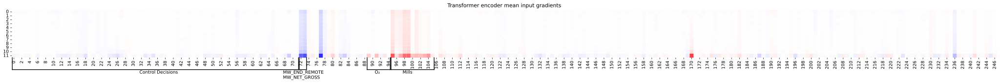

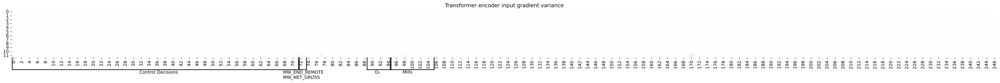

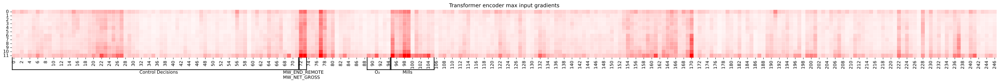

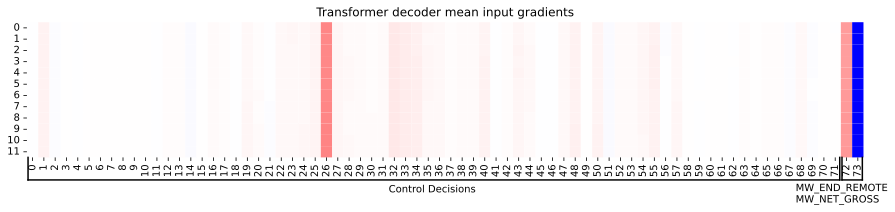

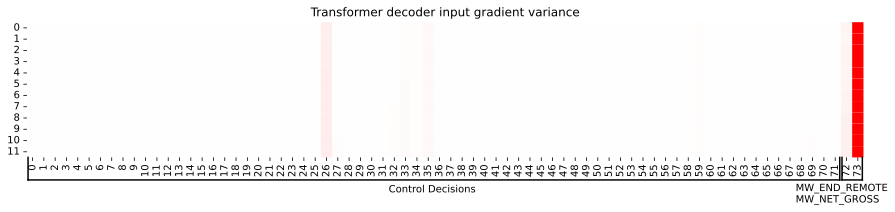

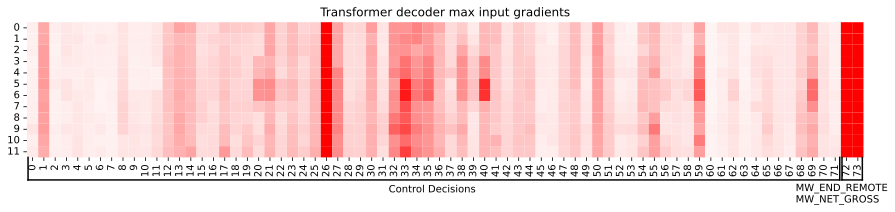

In [11]:
plotmap(t_grads[0]["encoder_inputs"], 'encoder', "Transformer encoder mean input gradients", np.mean, 12)
plotmap(t_grads[0]["encoder_inputs"], 'encoder', "Transformer encoder input gradient variance", np.var, 12)
plotmap(t_grads[0]["encoder_inputs"], 'encoder', 'Transformer encoder max input gradients', farfrom0, 12)

plotmap(t_grads[0]["decoder_inputs"], 'decoder', "Transformer decoder mean input gradients", np.mean, 12)
plotmap(t_grads[0]["decoder_inputs"], 'decoder', "Transformer decoder input gradient variance", np.var, 12)
plotmap(t_grads[0]["decoder_inputs"], 'decoder', 'Transformer decoder max input gradients', farfrom0, 12)

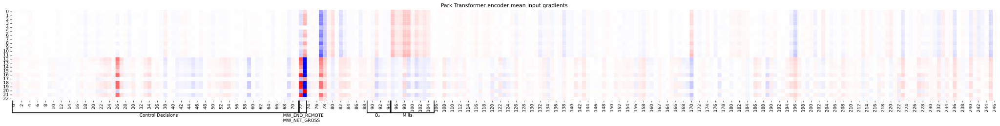

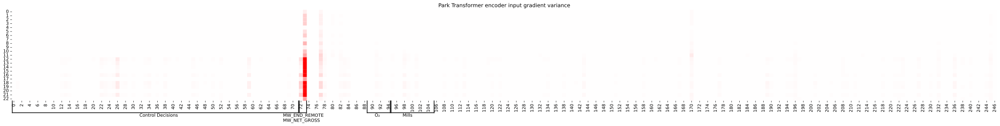

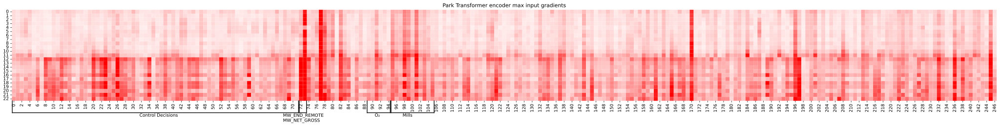

In [12]:
plotmap(p_grads[0]["encoder_inputs"], 'encoder', "Park Transformer encoder mean input gradients", np.mean, 23)
plotmap(p_grads[0]["encoder_inputs"], 'encoder', "Park Transformer encoder input gradient variance", np.var, 23)
plotmap(p_grads[0]["encoder_inputs"], 'encoder', 'Park Transformer encoder max input gradients', farfrom0, 23)


In [13]:
from time import time
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score

class predsandtimes():
    def __init__(self, model) -> None:
        self.name = model.name
        self.model = model
        self.preds    = []
        self.labels = []
        self.times    = []
        self.r2s   = []
        self.mses = []
        self.maes = []
        self.evs = []

    def multistep_pred(self, inpts, ftrs):
        preds = []
        s1 = time()
        for i in range(1, 13):
            pred = self.model.predict(inpts, verbose=0)
            preds.append(pred)
            try:
                inpts = inpts[:, 1:, :]
                next_step = ftrs[:, 11+i, 1:]
                next_step[:,  74:] = pred[:, 1:]
                next_step = rearrange(next_step, "b d -> b 1 d")
                inpts = np.concatenate([inpts, next_step], axis=1)
            except IndexError:
                break
        s2 = time()
        self.times.append(s2-s1)
        preds = rearrange(np.array(preds), "t b d -> b t d")
        self.preds.append(preds)
        self.labels.append(ftrs[:, 11:, 0])
        self.r2s.append(r2_score(ftrs[:, 11:, 0], preds[:, :, 0]))
        self.mses.append(mean_squared_error(ftrs[:, 11:, 0], preds[:, :, 0]))
        self.maes.append(mean_absolute_error(ftrs[:, 11:, 0], preds[:, :, 0]))
        self.evs.append(explained_variance_score(ftrs[:, 11:, 0], preds[:, :, 0]))


In [14]:
iteration = 0
metric_list = [predsandtimes(gru), predsandtimes(bigru), predsandtimes(lstm), predsandtimes(bilstm)]

for metric in metric_list:
        metric.multistep_pred(g_inputs.numpy(), g_features.numpy())

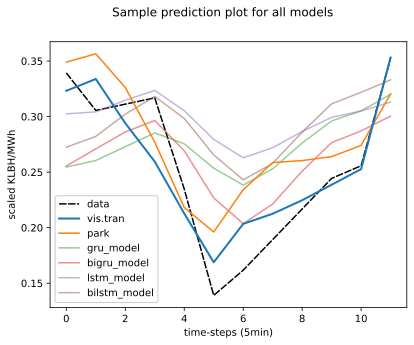

In [17]:

import matplotlib.patheffects as pe
plt.rcParams.update({
    "figure.facecolor":  (1.0, 1.0, 1.0, 0.0),  # red   with alpha = 30%
    "axes.facecolor":    (1.0, 1.0, 1.0, 0.0),  # green with alpha = 50%
    "savefig.facecolor": (1.0, 1.0, 1.0, 0.0),  # blue  with alpha = 20%
    "legend.facecolor": (1.0, 1.0, 1.0, 0.0),  # blue  with alpha = 20%
})
num = 16
fig, ax = plt.subplots()
ax.plot(t_labels[num], 'k', linestyle=(0, (5, 1)), label='data', zorder=0)
ax.plot(t_grads[1][num], linewidth=2, label='vis.tran', zorder=3)
ax.plot(p_grads[1][num], label='park', zorder=2)

for metric in metric_list:
    ax.plot(metric.preds[0][num, :, 0], label=metric.name, zorder=1, alpha=.5)
# linestyle=(0, (1, .5))
legend = ax.legend()
legend.get_frame().set_alpha(None)
legend.get_frame().set_facecolor((0, 0, 1, 0.0))
ax.set_xlabel("time-steps (5min)")
ax.set_ylabel("scaled KLBH/MWh")
ax.set_ylabel("scaled KLBH/MWh")
plt.suptitle("Sample prediction plot for all models")
plt.savefig(f'figures/mod_preds.svg', bbox_inches='tight')
plt.show()
